In [2]:
from __future__ import print_function
#%matplotlib inline
import argparse
import os
import random
import torch
import torch.nn as nn
import torch.nn.parallel
import torch.backends.cudnn as cudnn
import torch.optim as optim
import torch.utils.data
import torchvision.datasets as dset
import torchvision.transforms as transforms
import torchvision.utils as vutils
import numpy as np
import matplotlib.pyplot as plt
import matplotlib.animation as animation
from IPython.display import HTML

# Set random seed for reproducibility
manualSeed = 999
#manualSeed = random.randint(1, 10000) # use if you want new results
print("Random Seed: ", manualSeed)
random.seed(manualSeed)
torch.manual_seed(manualSeed)

Random Seed:  999


In [3]:
# Root directory for dataset
dataroot = "/ibex/scratch/alsaedsb/COVID_19/DATASETS/covid_chestxray_dataset_IEEE/"

# Number of workers for dataloader
workers = 2

# Batch size during training
batch_size = 128

# Spatial size of training images. All images will be resized to this
#   size using a transformer.
image_size = 64

# Number of channels in the training images. For color images this is 3
nc = 3

# Size of z latent vector (i.e. size of generator input)
nz = 100

# Size of feature maps in generator
ngf = 64

# Size of feature maps in discriminator
ndf = 64

# Number of training epochs
num_epochs = 1000

# Learning rate for optimizers
lr = 0.0002

# Beta1 hyperparam for Adam optimizers
beta1 = 0.5

# Number of GPUs available. Use 0 for CPU mode.
ngpu = 1

In [4]:
# We can use an image folder dataset the way we have it setup.
# Create the dataset
dataset = dset.ImageFolder(root=dataroot,
                           transform=transforms.Compose([
                               transforms.Resize(image_size),
                               transforms.CenterCrop(image_size),
                               transforms.ToTensor(),
                               transforms.Normalize((0.5, 0.5, 0.5), (0.5, 0.5, 0.5)),
                           ]))

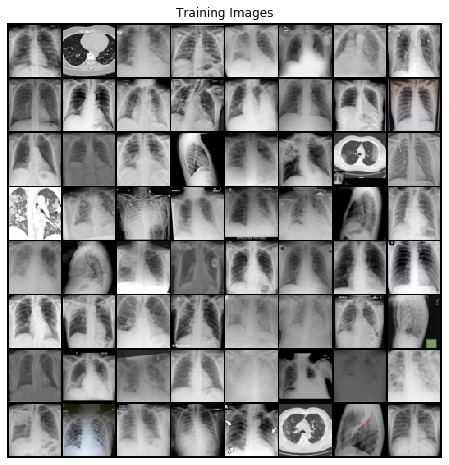

In [5]:
#Create the dataloader
dataloader = torch.utils.data.DataLoader(dataset, batch_size=batch_size,
                                         shuffle=True, num_workers=workers)

# Decide which device we want to run on
device = torch.device("cuda:0" if (torch.cuda.is_available() and ngpu > 0) else "cpu")

# Plot some training images
real_batch = next(iter(dataloader))
plt.figure(figsize=(8,8))
plt.axis("off")
plt.title("Training Images")
plt.imshow(np.transpose(vutils.make_grid(real_batch[0].to(device)[:64], padding=2, normalize=True).cpu(),(1,2,0)))

In [6]:
# custom weights initialization called on netG and netD
def weights_init(m):
    classname = m.__class__.__name__
    if classname.find('Conv') != -1:
        nn.init.normal_(m.weight.data, 0.0, 0.02)
    elif classname.find('BatchNorm') != -1:
        nn.init.normal_(m.weight.data, 1.0, 0.02)
        nn.init.constant_(m.bias.data, 0)

In [7]:
# Generator Code

class Generator(nn.Module):
    def __init__(self, ngpu):
        super(Generator, self).__init__()
        self.ngpu = ngpu
        self.main = nn.Sequential(
            # input is Z, going into a convolution
            nn.ConvTranspose2d( nz, ngf * 8, 4, 1, 0, bias=False),
            nn.BatchNorm2d(ngf * 8),
            nn.ReLU(True),
            # state size. (ngf*8) x 4 x 4
            nn.ConvTranspose2d(ngf * 8, ngf * 4, 4, 2, 1, bias=False),
            nn.BatchNorm2d(ngf * 4),
            nn.ReLU(True),
            # state size. (ngf*4) x 8 x 8
            nn.ConvTranspose2d( ngf * 4, ngf * 2, 4, 2, 1, bias=False),
            nn.BatchNorm2d(ngf * 2),
            nn.ReLU(True),
            # state size. (ngf*2) x 16 x 16
            nn.ConvTranspose2d( ngf * 2, ngf, 4, 2, 1, bias=False),
            nn.BatchNorm2d(ngf),
            nn.ReLU(True),
            # state size. (ngf) x 32 x 32
            nn.ConvTranspose2d( ngf, nc, 4, 2, 1, bias=False),
            nn.Tanh()
            # state size. (nc) x 64 x 64
        )

    def forward(self, input):
        return self.main(input)

In [8]:
# Create the generator
netG = Generator(ngpu).to(device)

# Handle multi-gpu if desired
if (device.type == 'cuda') and (ngpu > 1):
    netG = nn.DataParallel(netG, list(range(ngpu)))

# Apply the weights_init function to randomly initialize all weights
#  to mean=0, stdev=0.2.
netG.apply(weights_init)

# Print the model
print(netG)

Generator(
  (main): Sequential(
    (0): ConvTranspose2d(100, 512, kernel_size=(4, 4), stride=(1, 1), bias=False)
    (1): BatchNorm2d(512, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
    (2): ReLU(inplace=True)
    (3): ConvTranspose2d(512, 256, kernel_size=(4, 4), stride=(2, 2), padding=(1, 1), bias=False)
    (4): BatchNorm2d(256, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
    (5): ReLU(inplace=True)
    (6): ConvTranspose2d(256, 128, kernel_size=(4, 4), stride=(2, 2), padding=(1, 1), bias=False)
    (7): BatchNorm2d(128, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
    (8): ReLU(inplace=True)
    (9): ConvTranspose2d(128, 64, kernel_size=(4, 4), stride=(2, 2), padding=(1, 1), bias=False)
    (10): BatchNorm2d(64, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
    (11): ReLU(inplace=True)
    (12): ConvTranspose2d(64, 3, kernel_size=(4, 4), stride=(2, 2), padding=(1, 1), bias=False)
    (13): Tanh()
  )
)


In [9]:
class Discriminator(nn.Module):
    def __init__(self, ngpu):
        super(Discriminator, self).__init__()
        self.ngpu = ngpu
        self.main = nn.Sequential(
            # input is (nc) x 64 x 64
            nn.Conv2d(nc, ndf, 4, 2, 1, bias=False),
            nn.LeakyReLU(0.2, inplace=True),
            # state size. (ndf) x 32 x 32
            nn.Conv2d(ndf, ndf * 2, 4, 2, 1, bias=False),
            nn.BatchNorm2d(ndf * 2),
            nn.LeakyReLU(0.2, inplace=True),
            # state size. (ndf*2) x 16 x 16
            nn.Conv2d(ndf * 2, ndf * 4, 4, 2, 1, bias=False),
            nn.BatchNorm2d(ndf * 4),
            nn.LeakyReLU(0.2, inplace=True),
            # state size. (ndf*4) x 8 x 8
            nn.Conv2d(ndf * 4, ndf * 8, 4, 2, 1, bias=False),
            nn.BatchNorm2d(ndf * 8),
            nn.LeakyReLU(0.2, inplace=True),
            # state size. (ndf*8) x 4 x 4
            nn.Conv2d(ndf * 8, 1, 4, 1, 0, bias=False),
            nn.Sigmoid()
        )

    def forward(self, input):
        return self.main(input)

In [10]:
# Create the Discriminator
netD = Discriminator(ngpu).to(device)

# Handle multi-gpu if desired
if (device.type == 'cuda') and (ngpu > 1):
    netD = nn.DataParallel(netD, list(range(ngpu)))

# Apply the weights_init function to randomly initialize all weights
#  to mean=0, stdev=0.2.
netD.apply(weights_init)

# Print the model
print(netD)

Discriminator(
  (main): Sequential(
    (0): Conv2d(3, 64, kernel_size=(4, 4), stride=(2, 2), padding=(1, 1), bias=False)
    (1): LeakyReLU(negative_slope=0.2, inplace=True)
    (2): Conv2d(64, 128, kernel_size=(4, 4), stride=(2, 2), padding=(1, 1), bias=False)
    (3): BatchNorm2d(128, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
    (4): LeakyReLU(negative_slope=0.2, inplace=True)
    (5): Conv2d(128, 256, kernel_size=(4, 4), stride=(2, 2), padding=(1, 1), bias=False)
    (6): BatchNorm2d(256, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
    (7): LeakyReLU(negative_slope=0.2, inplace=True)
    (8): Conv2d(256, 512, kernel_size=(4, 4), stride=(2, 2), padding=(1, 1), bias=False)
    (9): BatchNorm2d(512, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
    (10): LeakyReLU(negative_slope=0.2, inplace=True)
    (11): Conv2d(512, 1, kernel_size=(4, 4), stride=(1, 1), bias=False)
    (12): Sigmoid()
  )
)


In [11]:
# Initialize BCELoss function
criterion = nn.BCELoss()

# Create batch of latent vectors that we will use to visualize
#  the progression of the generator
fixed_noise = torch.randn(64, nz, 1, 1, device=device)

# Establish convention for real and fake labels during training
real_label = 1.
fake_label = 0.

# Setup Adam optimizers for both G and D
optimizerD = optim.Adam(netD.parameters(), lr=lr, betas=(beta1, 0.999))
optimizerG = optim.Adam(netG.parameters(), lr=lr, betas=(beta1, 0.999))

In [12]:
# Training Loop

# Lists to keep track of progress
img_list = []
G_losses = []
D_losses = []
iters = 0

print("Starting Training Loop...")
# For each epoch
for epoch in range(num_epochs):
    # For each batch in the dataloader
    for i, data in enumerate(dataloader, 0):

        ############################
        # (1) Update D network: maximize log(D(x)) + log(1 - D(G(z)))
        ###########################
        ## Train with all-real batch
        netD.zero_grad()
        # Format batch
        real_cpu = data[0].to(device)
        b_size = real_cpu.size(0)
        label = torch.full((b_size,), real_label, dtype=torch.float, device=device)
        # Forward pass real batch through D
        output = netD(real_cpu).view(-1)
        # Calculate loss on all-real batch
        errD_real = criterion(output, label)
        # Calculate gradients for D in backward pass
        errD_real.backward()
        D_x = output.mean().item()

        ## Train with all-fake batch
        # Generate batch of latent vectors
        noise = torch.randn(b_size, nz, 1, 1, device=device)
        # Generate fake image batch with G
        fake = netG(noise)
        label.fill_(fake_label)
        # Classify all fake batch with D
        output = netD(fake.detach()).view(-1)
        # Calculate D's loss on the all-fake batch
        errD_fake = criterion(output, label)
        # Calculate the gradients for this batch
        errD_fake.backward()
        D_G_z1 = output.mean().item()
        # Add the gradients from the all-real and all-fake batches
        errD = errD_real + errD_fake
        # Update D
        optimizerD.step()

        ############################
        # (2) Update G network: maximize log(D(G(z)))
        ###########################
        netG.zero_grad()
        label.fill_(real_label)  # fake labels are real for generator cost
        # Since we just updated D, perform another forward pass of all-fake batch through D
        output = netD(fake).view(-1)
        # Calculate G's loss based on this output
        errG = criterion(output, label)
        # Calculate gradients for G
        errG.backward()
        D_G_z2 = output.mean().item()
        # Update G
        optimizerG.step()

        # Output training stats
        if i % 50 == 0:
            print('[%d/%d][%d/%d]\tLoss_D: %.4f\tLoss_G: %.4f\tD(x): %.4f\tD(G(z)): %.4f / %.4f'
                  % (epoch, num_epochs, i, len(dataloader),
                     errD.item(), errG.item(), D_x, D_G_z1, D_G_z2))

        # Save Losses for plotting later
        G_losses.append(errG.item())
        D_losses.append(errD.item())

        # Check how the generator is doing by saving G's output on fixed_noise
        if (iters % 500 == 0) or ((epoch == num_epochs-1) and (i == len(dataloader)-1)):
            with torch.no_grad():
                fake = netG(fixed_noise).detach().cpu()
            img_list.append(vutils.make_grid(fake, padding=2, normalize=True))

        iters += 1

Starting Training Loop...
[0/1000][0/8]	Loss_D: 1.4171	Loss_G: 5.4809	D(x): 0.6352	D(G(z)): 0.5231 / 0.0064
[1/1000][0/8]	Loss_D: 0.1804	Loss_G: 8.3696	D(x): 0.9487	D(G(z)): 0.0876 / 0.0004
[2/1000][0/8]	Loss_D: 0.0985	Loss_G: 10.6862	D(x): 0.9892	D(G(z)): 0.0797 / 0.0000
[3/1000][0/8]	Loss_D: 0.0237	Loss_G: 7.7717	D(x): 0.9812	D(G(z)): 0.0024 / 0.0009
[4/1000][0/8]	Loss_D: 0.0483	Loss_G: 20.6609	D(x): 0.9709	D(G(z)): 0.0000 / 0.0000
[5/1000][0/8]	Loss_D: 0.7900	Loss_G: 24.6766	D(x): 0.9808	D(G(z)): 0.4709 / 0.0000
[6/1000][0/8]	Loss_D: 0.1249	Loss_G: 29.3478	D(x): 0.9189	D(G(z)): 0.0000 / 0.0000
[7/1000][0/8]	Loss_D: 0.4835	Loss_G: 35.5932	D(x): 0.8460	D(G(z)): 0.0000 / 0.0000
[8/1000][0/8]	Loss_D: 0.0046	Loss_G: 25.0360	D(x): 0.9958	D(G(z)): 0.0000 / 0.0000
[9/1000][0/8]	Loss_D: 1.0708	Loss_G: 22.0121	D(x): 0.6444	D(G(z)): 0.0000 / 0.0000
[10/1000][0/8]	Loss_D: 1.0827	Loss_G: 15.9412	D(x): 0.9803	D(G(z)): 0.5151 / 0.0000
[11/1000][0/8]	Loss_D: 2.3531	Loss_G: 20.7419	D(x): 0.9659	D(G(

[99/1000][0/8]	Loss_D: 0.5313	Loss_G: 4.1264	D(x): 0.8734	D(G(z)): 0.2724 / 0.0330
[100/1000][0/8]	Loss_D: 0.5391	Loss_G: 4.4151	D(x): 0.8938	D(G(z)): 0.3169 / 0.0199
[101/1000][0/8]	Loss_D: 0.2757	Loss_G: 3.7075	D(x): 0.9097	D(G(z)): 0.1546 / 0.0423
[102/1000][0/8]	Loss_D: 1.0892	Loss_G: 2.1918	D(x): 0.4211	D(G(z)): 0.0662 / 0.1774
[103/1000][0/8]	Loss_D: 1.2624	Loss_G: 3.7185	D(x): 0.9440	D(G(z)): 0.5869 / 0.0703
[104/1000][0/8]	Loss_D: 1.4823	Loss_G: 4.4995	D(x): 0.9456	D(G(z)): 0.6453 / 0.0220
[105/1000][0/8]	Loss_D: 2.0315	Loss_G: 5.4627	D(x): 0.9953	D(G(z)): 0.7751 / 0.0109
[106/1000][0/8]	Loss_D: 0.9162	Loss_G: 4.3128	D(x): 0.9962	D(G(z)): 0.5434 / 0.0254
[107/1000][0/8]	Loss_D: 0.6113	Loss_G: 3.2990	D(x): 0.9886	D(G(z)): 0.3939 / 0.0766
[108/1000][0/8]	Loss_D: 0.7276	Loss_G: 2.2116	D(x): 0.7210	D(G(z)): 0.2745 / 0.1641
[109/1000][0/8]	Loss_D: 1.5583	Loss_G: 4.7166	D(x): 0.9905	D(G(z)): 0.7202 / 0.0190
[110/1000][0/8]	Loss_D: 0.3935	Loss_G: 2.2171	D(x): 0.8030	D(G(z)): 0.1423 / 

[197/1000][0/8]	Loss_D: 0.1447	Loss_G: 3.5284	D(x): 0.9653	D(G(z)): 0.0982 / 0.0456
[198/1000][0/8]	Loss_D: 0.3662	Loss_G: 3.4728	D(x): 0.9952	D(G(z)): 0.2699 / 0.0477
[199/1000][0/8]	Loss_D: 0.4867	Loss_G: 3.8200	D(x): 0.6646	D(G(z)): 0.0167 / 0.0495
[200/1000][0/8]	Loss_D: 1.1675	Loss_G: 6.6929	D(x): 0.9984	D(G(z)): 0.6218 / 0.0033
[201/1000][0/8]	Loss_D: 2.5293	Loss_G: 6.6449	D(x): 0.9980	D(G(z)): 0.8164 / 0.0056
[202/1000][0/8]	Loss_D: 0.1923	Loss_G: 3.4142	D(x): 0.9900	D(G(z)): 0.1499 / 0.0615
[203/1000][0/8]	Loss_D: 0.2143	Loss_G: 5.0622	D(x): 0.9930	D(G(z)): 0.1562 / 0.0252
[204/1000][0/8]	Loss_D: 1.8371	Loss_G: 3.3483	D(x): 0.9994	D(G(z)): 0.7367 / 0.0641
[205/1000][0/8]	Loss_D: 0.7700	Loss_G: 4.0357	D(x): 0.9984	D(G(z)): 0.4481 / 0.0349
[206/1000][0/8]	Loss_D: 0.0996	Loss_G: 3.5989	D(x): 0.9965	D(G(z)): 0.0871 / 0.0454
[207/1000][0/8]	Loss_D: 0.0346	Loss_G: 4.8567	D(x): 0.9924	D(G(z)): 0.0260 / 0.0118
[208/1000][0/8]	Loss_D: 0.3841	Loss_G: 2.5640	D(x): 0.9944	D(G(z)): 0.2801 /

[295/1000][0/8]	Loss_D: 0.2347	Loss_G: 3.0009	D(x): 0.8755	D(G(z)): 0.0853 / 0.0834
[296/1000][0/8]	Loss_D: 0.3379	Loss_G: 3.9603	D(x): 0.9161	D(G(z)): 0.1978 / 0.0352
[297/1000][0/8]	Loss_D: 0.2489	Loss_G: 4.1475	D(x): 0.8916	D(G(z)): 0.1113 / 0.0290
[298/1000][0/8]	Loss_D: 2.1645	Loss_G: 8.7030	D(x): 0.9854	D(G(z)): 0.7832 / 0.0004
[299/1000][0/8]	Loss_D: 0.5440	Loss_G: 1.9839	D(x): 0.6506	D(G(z)): 0.0408 / 0.2595
[300/1000][0/8]	Loss_D: 0.3995	Loss_G: 4.6158	D(x): 0.9931	D(G(z)): 0.2818 / 0.0213
[301/1000][0/8]	Loss_D: 0.3291	Loss_G: 4.5260	D(x): 0.9519	D(G(z)): 0.1842 / 0.0232
[302/1000][0/8]	Loss_D: 0.3347	Loss_G: 4.3737	D(x): 0.9963	D(G(z)): 0.2611 / 0.0196
[303/1000][0/8]	Loss_D: 0.1354	Loss_G: 3.8046	D(x): 0.9779	D(G(z)): 0.1025 / 0.0320
[304/1000][0/8]	Loss_D: 2.5718	Loss_G: 5.3271	D(x): 0.9956	D(G(z)): 0.8669 / 0.0194
[305/1000][0/8]	Loss_D: 0.3258	Loss_G: 5.4139	D(x): 0.9884	D(G(z)): 0.2366 / 0.0089
[306/1000][0/8]	Loss_D: 0.9675	Loss_G: 7.1444	D(x): 0.9948	D(G(z)): 0.5601 /

[393/1000][0/8]	Loss_D: 1.6610	Loss_G: 7.6902	D(x): 0.9862	D(G(z)): 0.6900 / 0.0013
[394/1000][0/8]	Loss_D: 0.1129	Loss_G: 5.7754	D(x): 0.9134	D(G(z)): 0.0106 / 0.0085
[395/1000][0/8]	Loss_D: 0.1597	Loss_G: 4.1726	D(x): 0.9471	D(G(z)): 0.0950 / 0.0268
[396/1000][0/8]	Loss_D: 1.5670	Loss_G: 6.4391	D(x): 0.9904	D(G(z)): 0.6866 / 0.0077
[397/1000][0/8]	Loss_D: 0.8038	Loss_G: 7.7967	D(x): 0.9303	D(G(z)): 0.4583 / 0.0015
[398/1000][0/8]	Loss_D: 0.2844	Loss_G: 3.1877	D(x): 0.8400	D(G(z)): 0.0887 / 0.0663
[399/1000][0/8]	Loss_D: 0.3548	Loss_G: 4.2483	D(x): 0.9951	D(G(z)): 0.2681 / 0.0280
[400/1000][0/8]	Loss_D: 0.1622	Loss_G: 4.0469	D(x): 0.9836	D(G(z)): 0.1297 / 0.0257
[401/1000][0/8]	Loss_D: 2.5471	Loss_G: 8.6241	D(x): 0.9966	D(G(z)): 0.8528 / 0.0013
[402/1000][0/8]	Loss_D: 0.6339	Loss_G: 5.5467	D(x): 0.9242	D(G(z)): 0.3276 / 0.0120
[403/1000][0/8]	Loss_D: 1.1214	Loss_G: 5.7450	D(x): 0.9903	D(G(z)): 0.5962 / 0.0234
[404/1000][0/8]	Loss_D: 0.7246	Loss_G: 2.4754	D(x): 0.5774	D(G(z)): 0.0257 /

[491/1000][0/8]	Loss_D: 0.4932	Loss_G: 4.0772	D(x): 0.9964	D(G(z)): 0.3210 / 0.0328
[492/1000][0/8]	Loss_D: 0.4065	Loss_G: 5.3206	D(x): 0.9886	D(G(z)): 0.2855 / 0.0085
[493/1000][0/8]	Loss_D: 0.1980	Loss_G: 4.0372	D(x): 0.9765	D(G(z)): 0.1484 / 0.0304
[494/1000][0/8]	Loss_D: 0.8540	Loss_G: 6.6400	D(x): 0.9937	D(G(z)): 0.4989 / 0.0032
[495/1000][0/8]	Loss_D: 0.0859	Loss_G: 4.4793	D(x): 0.9688	D(G(z)): 0.0487 / 0.0190
[496/1000][0/8]	Loss_D: 0.6730	Loss_G: 4.9212	D(x): 0.9959	D(G(z)): 0.4266 / 0.0125
[497/1000][0/8]	Loss_D: 0.0741	Loss_G: 4.3770	D(x): 0.9609	D(G(z)): 0.0321 / 0.0239
[498/1000][0/8]	Loss_D: 0.1234	Loss_G: 4.5097	D(x): 0.9059	D(G(z)): 0.0190 / 0.0201
[499/1000][0/8]	Loss_D: 0.1076	Loss_G: 4.3619	D(x): 0.9365	D(G(z)): 0.0380 / 0.0255
[500/1000][0/8]	Loss_D: 0.0374	Loss_G: 5.9501	D(x): 0.9722	D(G(z)): 0.0087 / 0.0058
[501/1000][0/8]	Loss_D: 0.1110	Loss_G: 4.1778	D(x): 0.9822	D(G(z)): 0.0842 / 0.0234
[502/1000][0/8]	Loss_D: 0.2655	Loss_G: 5.4176	D(x): 0.9761	D(G(z)): 0.2021 /

[589/1000][0/8]	Loss_D: 0.0690	Loss_G: 4.2283	D(x): 0.9820	D(G(z)): 0.0483 / 0.0242
[590/1000][0/8]	Loss_D: 0.0558	Loss_G: 4.1480	D(x): 0.9969	D(G(z)): 0.0494 / 0.0257
[591/1000][0/8]	Loss_D: 0.1378	Loss_G: 3.9385	D(x): 0.9972	D(G(z)): 0.1185 / 0.0302
[592/1000][0/8]	Loss_D: 0.1461	Loss_G: 3.6227	D(x): 0.8943	D(G(z)): 0.0288 / 0.0449
[593/1000][0/8]	Loss_D: 1.6095	Loss_G: 8.0842	D(x): 0.9958	D(G(z)): 0.6424 / 0.0030
[594/1000][0/8]	Loss_D: 0.0603	Loss_G: 4.7831	D(x): 0.9957	D(G(z)): 0.0523 / 0.0173
[595/1000][0/8]	Loss_D: 0.0804	Loss_G: 4.2805	D(x): 0.9662	D(G(z)): 0.0432 / 0.0262
[596/1000][0/8]	Loss_D: 0.0531	Loss_G: 5.2046	D(x): 0.9732	D(G(z)): 0.0246 / 0.0133
[597/1000][0/8]	Loss_D: 0.1278	Loss_G: 4.1921	D(x): 0.9711	D(G(z)): 0.0901 / 0.0285
[598/1000][0/8]	Loss_D: 0.7279	Loss_G: 5.8177	D(x): 0.9995	D(G(z)): 0.4146 / 0.0069
[599/1000][0/8]	Loss_D: 0.0472	Loss_G: 4.9436	D(x): 0.9884	D(G(z)): 0.0335 / 0.0135
[600/1000][0/8]	Loss_D: 0.8934	Loss_G: 9.1616	D(x): 0.9973	D(G(z)): 0.4748 /

[687/1000][0/8]	Loss_D: 0.1913	Loss_G: 7.2654	D(x): 0.9942	D(G(z)): 0.1339 / 0.0022
[688/1000][0/8]	Loss_D: 0.0749	Loss_G: 4.8439	D(x): 0.9974	D(G(z)): 0.0672 / 0.0156
[689/1000][0/8]	Loss_D: 0.0712	Loss_G: 5.4638	D(x): 0.9393	D(G(z)): 0.0062 / 0.0081
[690/1000][0/8]	Loss_D: 0.0573	Loss_G: 4.7045	D(x): 0.9890	D(G(z)): 0.0436 / 0.0220
[691/1000][0/8]	Loss_D: 0.8134	Loss_G: 6.5163	D(x): 0.9989	D(G(z)): 0.4534 / 0.0041
[692/1000][0/8]	Loss_D: 0.1485	Loss_G: 5.2723	D(x): 0.9934	D(G(z)): 0.0923 / 0.0126
[693/1000][0/8]	Loss_D: 0.0205	Loss_G: 7.9532	D(x): 0.9874	D(G(z)): 0.0074 / 0.0035
[694/1000][0/8]	Loss_D: 1.5849	Loss_G: 11.5001	D(x): 0.9948	D(G(z)): 0.6978 / 0.0001
[695/1000][0/8]	Loss_D: 0.2428	Loss_G: 4.9355	D(x): 0.9915	D(G(z)): 0.1827 / 0.0151
[696/1000][0/8]	Loss_D: 2.2668	Loss_G: 11.9806	D(x): 0.9993	D(G(z)): 0.7641 / 0.0000
[697/1000][0/8]	Loss_D: 0.8116	Loss_G: 7.2152	D(x): 0.8348	D(G(z)): 0.3741 / 0.0175
[698/1000][0/8]	Loss_D: 0.2344	Loss_G: 4.3345	D(x): 0.9152	D(G(z)): 0.1135

[785/1000][0/8]	Loss_D: 0.0334	Loss_G: 6.4529	D(x): 0.9866	D(G(z)): 0.0189 / 0.0068
[786/1000][0/8]	Loss_D: 0.1063	Loss_G: 5.6993	D(x): 0.9895	D(G(z)): 0.0850 / 0.0076
[787/1000][0/8]	Loss_D: 0.0672	Loss_G: 4.5954	D(x): 0.9856	D(G(z)): 0.0484 / 0.0188
[788/1000][0/8]	Loss_D: 0.3731	Loss_G: 8.7396	D(x): 0.9939	D(G(z)): 0.2729 / 0.0016
[789/1000][0/8]	Loss_D: 0.0881	Loss_G: 6.0702	D(x): 0.9864	D(G(z)): 0.0652 / 0.0091
[790/1000][0/8]	Loss_D: 0.0315	Loss_G: 6.4806	D(x): 0.9853	D(G(z)): 0.0162 / 0.0042
[791/1000][0/8]	Loss_D: 0.0231	Loss_G: 5.4382	D(x): 0.9930	D(G(z)): 0.0158 / 0.0073
[792/1000][0/8]	Loss_D: 0.0439	Loss_G: 4.6476	D(x): 0.9911	D(G(z)): 0.0337 / 0.0179
[793/1000][0/8]	Loss_D: 0.0767	Loss_G: 5.0482	D(x): 0.9360	D(G(z)): 0.0089 / 0.0130
[794/1000][0/8]	Loss_D: 0.0541	Loss_G: 5.1504	D(x): 0.9709	D(G(z)): 0.0234 / 0.0114
[795/1000][0/8]	Loss_D: 2.2880	Loss_G: 20.3324	D(x): 0.9998	D(G(z)): 0.7661 / 0.0000
[796/1000][0/8]	Loss_D: 0.5097	Loss_G: 1.7592	D(x): 0.7179	D(G(z)): 0.0662 

[883/1000][0/8]	Loss_D: 0.2793	Loss_G: 3.2080	D(x): 0.7889	D(G(z)): 0.0160 / 0.0720
[884/1000][0/8]	Loss_D: 0.0411	Loss_G: 4.7982	D(x): 0.9812	D(G(z)): 0.0216 / 0.0129
[885/1000][0/8]	Loss_D: 0.0436	Loss_G: 4.9797	D(x): 0.9817	D(G(z)): 0.0227 / 0.0165
[886/1000][0/8]	Loss_D: 2.0736	Loss_G: 8.9877	D(x): 0.9994	D(G(z)): 0.7320 / 0.0013
[887/1000][0/8]	Loss_D: 0.0506	Loss_G: 5.2259	D(x): 0.9866	D(G(z)): 0.0351 / 0.0139
[888/1000][0/8]	Loss_D: 0.0880	Loss_G: 4.8183	D(x): 0.9582	D(G(z)): 0.0417 / 0.0171
[889/1000][0/8]	Loss_D: 0.1770	Loss_G: 3.9515	D(x): 0.8634	D(G(z)): 0.0217 / 0.0341
[890/1000][0/8]	Loss_D: 0.0346	Loss_G: 5.0481	D(x): 0.9861	D(G(z)): 0.0201 / 0.0143
[891/1000][0/8]	Loss_D: 0.0721	Loss_G: 5.2487	D(x): 0.9890	D(G(z)): 0.0576 / 0.0106
[892/1000][0/8]	Loss_D: 0.0273	Loss_G: 5.0148	D(x): 0.9961	D(G(z)): 0.0229 / 0.0103
[893/1000][0/8]	Loss_D: 0.0588	Loss_G: 4.6116	D(x): 0.9974	D(G(z)): 0.0532 / 0.0166
[894/1000][0/8]	Loss_D: 0.0413	Loss_G: 5.7067	D(x): 0.9941	D(G(z)): 0.0340 /

[981/1000][0/8]	Loss_D: 0.1351	Loss_G: 7.2356	D(x): 0.9292	D(G(z)): 0.0351 / 0.0041
[982/1000][0/8]	Loss_D: 0.0277	Loss_G: 5.6070	D(x): 0.9951	D(G(z)): 0.0218 / 0.0080
[983/1000][0/8]	Loss_D: 0.0362	Loss_G: 5.0158	D(x): 0.9891	D(G(z)): 0.0245 / 0.0109
[984/1000][0/8]	Loss_D: 0.1130	Loss_G: 4.9471	D(x): 0.9895	D(G(z)): 0.0918 / 0.0140
[985/1000][0/8]	Loss_D: 1.4701	Loss_G: 16.5870	D(x): 0.9999	D(G(z)): 0.6658 / 0.0001
[986/1000][0/8]	Loss_D: 0.0708	Loss_G: 5.2821	D(x): 0.9746	D(G(z)): 0.0415 / 0.0114
[987/1000][0/8]	Loss_D: 0.0083	Loss_G: 7.1845	D(x): 0.9958	D(G(z)): 0.0041 / 0.0048
[988/1000][0/8]	Loss_D: 0.0227	Loss_G: 5.7058	D(x): 0.9914	D(G(z)): 0.0137 / 0.0078
[989/1000][0/8]	Loss_D: 0.8937	Loss_G: 12.9939	D(x): 0.9999	D(G(z)): 0.5180 / 0.0002
[990/1000][0/8]	Loss_D: 0.0775	Loss_G: 6.6509	D(x): 0.9982	D(G(z)): 0.0636 / 0.0063
[991/1000][0/8]	Loss_D: 0.3043	Loss_G: 8.0911	D(x): 0.9992	D(G(z)): 0.2046 / 0.0009
[992/1000][0/8]	Loss_D: 0.0376	Loss_G: 6.3126	D(x): 0.9968	D(G(z)): 0.0327

In [35]:
real_cpu.shape

torch.Size([34, 3, 64, 64])

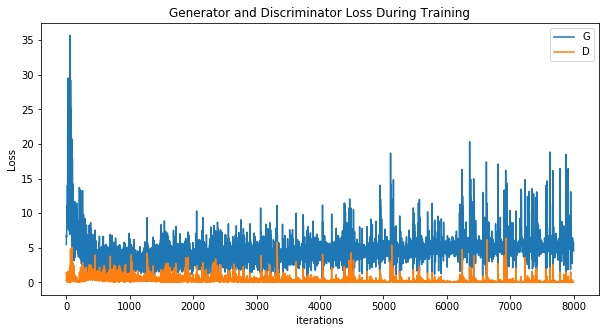

In [13]:
plt.figure(figsize=(10,5))
plt.title("Generator and Discriminator Loss During Training")
plt.plot(G_losses,label="G")
plt.plot(D_losses,label="D")
plt.xlabel("iterations")
plt.ylabel("Loss")
plt.legend()
plt.show()

In [23]:
output

tensor([0.0031, 0.0080, 0.0092, 0.0745, 0.0064, 0.0002, 0.0356, 0.0744, 0.1279,
        0.0167, 0.0131, 0.0032, 0.0023, 0.0461, 0.0330, 0.0115, 0.0120, 0.0003,
        0.0313, 0.0436, 0.0007, 0.0706, 0.0147, 0.0179, 0.0095, 0.0162, 0.0026,
        0.0376, 0.0068, 0.0064, 0.0008, 0.0606, 0.0467, 0.0020],
       device='cuda:0', grad_fn=<ViewBackward>)

In [29]:
len(label)

34

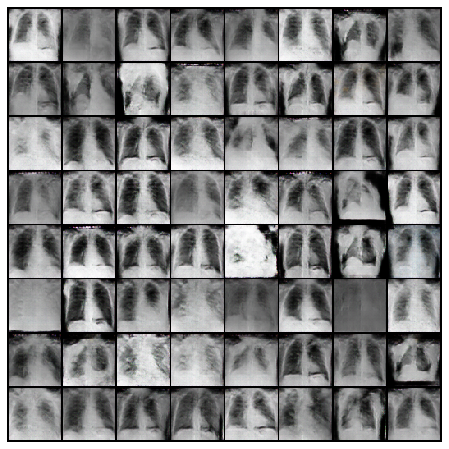

In [14]:
#%%capture
fig = plt.figure(figsize=(8,8))
plt.axis("off")
ims = [[plt.imshow(np.transpose(i,(1,2,0)), animated=True)] for i in img_list]
ani = animation.ArtistAnimation(fig, ims, interval=1000, repeat_delay=1000, blit=True)

HTML(ani.to_jshtml())

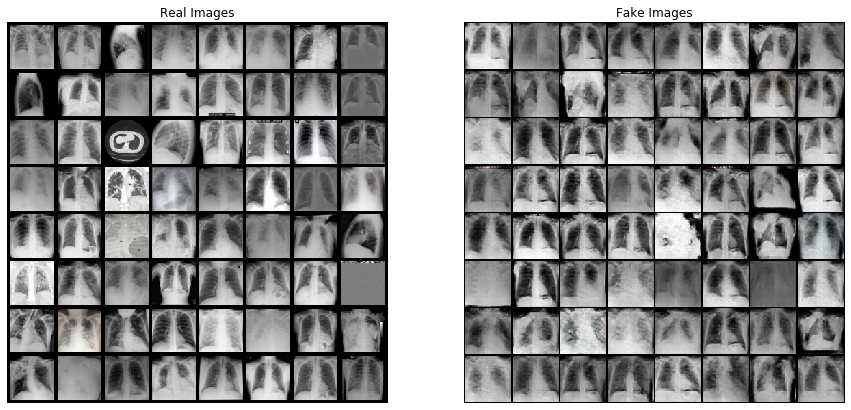

In [15]:
# Grab a batch of real images from the dataloader
real_batch = next(iter(dataloader))

# Plot the real images
plt.figure(figsize=(15,15))
plt.subplot(1,2,1)
plt.axis("off")
plt.title("Real Images")
plt.imshow(np.transpose(vutils.make_grid(real_batch[0].to(device)[:64], padding=5, normalize=True).cpu(),(1,2,0)))

# Plot the fake images from the last epoch
plt.subplot(1,2,2)
plt.axis("off")
plt.title("Fake Images")
plt.imshow(np.transpose(img_list[-1],(1,2,0)))
plt.show()

In [18]:
my_list[0]

NameError: name 'my_list' is not defined